# Vehicle Tracking & Traffic Analysis | Computer Vision Project (Speed and Traffic intensity Estimation)

---

[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/uWP6UjDeZvY)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/roboflow/supervision/tree/develop/examples/speed_estimation)

## **Project Overview**
This project implements a vehicle tracking, speed estimation, OCR and traffic intensity system using the YOLO object detection model and the Supervision library. The implementation is built on a Roboflow's Supervision library , which provides tools for object detection and tracking. The project has gone through several stages of development, each aimed at improving accuracy, stability, and functionality.




## **Project Stages**
### **Stage 1: Initial Implementation Using Roboflow Supervision Library**
- The first stage was based on the Roboflow tutorial for object tracking using the Supervision library ([link](https://supervision.roboflow.com/how_to/track_objects/)).
- Utilized YOLO (You Only Look Once) for object detection to identify vehicles in the video.

- Applied Tracking with ByteTrack for object tracking to maintain vehicle identities across frames.

- The speed estimation was calculated using the distance traveled between the first and last points in a deque of coordinates.
  
### ***Challenges:

- Accuracy Issues: The speed estimation was not accurate and not stable and very variable. due to noise and variability in the data.

- Bounding Box Overlap: When two vehicles overlapped in the frame, the bounding boxes and tracers became confused, leading to incorrect tracking.

  
### **Stage 2: Improving Speed Detection Stability**
To enhance speed estimation, the following improvements were made:

#### **1. Smoothing Functions**
- **Moving Average**: Applied a moving average function over a window of 5 frames to reduce speed fluctuations.
- **Exponential Smoothing**: Used to smooth speed values and provide more stable results.

#### **2. Kalman Filter for Noise Reduction**
- A simplified Kalman filter was implemented for each tracked vehicle.
- It helps refine speed estimations by filtering out noise and handling outliers effectively.

#### **3. Increased Window Size for More Stable Speed Calculation**
- The deque size for storing vehicle coordinates was increased to `video_info.fps * 2` frames.
- This allowed for speed averaging over a longer period, reducing short-term fluctuations.

#### **4. Multiple Points for Speed Calculation**
- Instead of relying solely on the first and last points in the deque, speed is now calculated using multiple points.
- This provides a more stable and accurate speed estimate.

#### **5. Final Speed Filtering**
- The Kalman filter processes the smoothed speed values, combining predictions with measurements for enhanced accuracy.
- The final refined speed is displayed for each detected vehicle.

### **Stage 3: Traffic Intensity Detection and Vehicle Counting**
- Implemented a system to count vehicles moving **up** and **down** in the frame.
- Added real-time traffic intensity classification based on vehicle count:
  - **Low Traffic** (Green) for <= 5 vehicles per minute.
  - **Moderate Traffic** (Yellow) for 6–15 vehicles per minute.
  - **Heavy Traffic** (Red) for >15 vehicles per minute.
- Enhanced visualization with labeled vehicle speeds, counts, and traffic levels displayed in the video.

## **Summary**
This project integrates YOLO object detection with ByteTrack tracking and advanced filtering techniques to achieve robust vehicle tracking and speed estimation. By addressing bounding box overlaps and improving speed calculation stability, the system now provides more reliable and accurate vehicle movement analysis. Additional traffic intensity classification enhances the practical usability of the solution for traffic monitoring applications.


## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install
- Imports
- Download Data
- Configuration
- Source and Target ROIs
- Transform Perspective
- Process Video

## Stage 1: Initial Implementation Using Roboflow Supervision Library


### Installing needed libraries

In [1]:
!pip install opencv-python
!pip install ultralytics
!pip install -q supervision "ultralytics<=8.3.40"
!pip install --upgrade supervision
!pip install super_gradients
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 15.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 4.0 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 24.3 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 11.3 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver 

In [2]:
from supervision.assets import download_assets, VideoAssets

download_assets(VideoAssets.VEHICLES)

  0%|          | 0/35345757 [00:00<?, ?it/s]

'vehicles.mp4'

### Importing Libraries

In [3]:
import cv2
import numpy as np
import supervision as sv
from tqdm import tqdm
from ultralytics import YOLO
from supervision.assets import VideoAssets, download_assets
from collections import defaultdict, deque

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Implementaion

- #### First of all, We must to calculate a coordinates of our working area of our video dataset and store in array called "SOURCE", We will use it later as the so-called Polygon zone.

- #### We can do the calculetion operation manually as below:

- ![Source and Target ROIs](https://storage.googleapis.com/com-roboflow-marketing/notebooks/speed-estimation-perspective-1.png)

- #### Also, After reserach the target area of roads is 25x250

- #### But I suggest to do it automatically by polygonzone.roboflow site ([link](https://polygonzone.roboflow.com/)) , and copy the Coordinates.
  ![polygonzone.roboflow](https://i.ibb.co/0prMNktR/5.png)

In [4]:
# Load video information
video_info = sv.VideoInfo.from_video_path(video_path='/kaggle/working/vehicles.mp4')
SOURCE_VIDEO_PATH='/kaggle/working/vehicles.mp4'

SOURCE = np.array([
    [1252, 787],
    [2298, 803],
    [5039, 2159],
    [-550, 2159]
])

TARGET_WIDTH = 25
TARGET_HEIGHT = 250

TARGET = np.array([
    [0, 0],
    [TARGET_WIDTH - 1, 0],
    [TARGET_WIDTH - 1, TARGET_HEIGHT - 1],
    [0, TARGET_HEIGHT - 1],
])

In [5]:
## Transform Perspective
class ViewTransformer:

    def __init__(self, source: np.ndarray, target: np.ndarray) -> None:
        source = source.astype(np.float32)
        target = target.astype(np.float32)
        self.m = cv2.getPerspectiveTransform(source, target)

    def transform_points(self, points: np.ndarray) -> np.ndarray:
        if points.size == 0:
            return points

        reshaped_points = points.reshape(-1, 1, 2).astype(np.float32)
        transformed_points = cv2.perspectiveTransform(reshaped_points, self.m)
        return transformed_points.reshape(-1, 2)

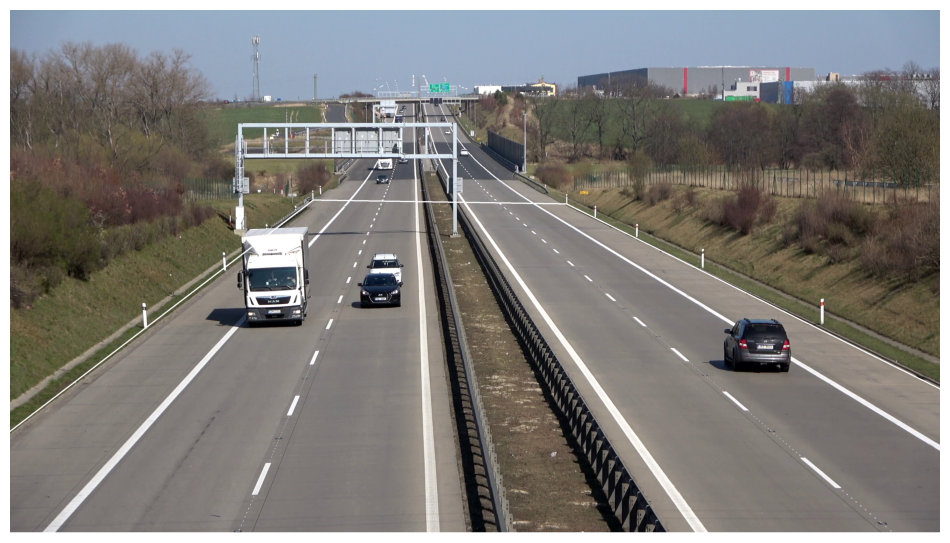

In [6]:
### Display polygon zone
frame_generator = sv.get_video_frames_generator(source_path=SOURCE_VIDEO_PATH)
frame_iterator = iter(frame_generator)
frame = next(frame_iterator)
annotated_frame = frame.copy()

# Draw the polygon
annotated_frame = sv.draw_polygon(
    scene=annotated_frame, 
    polygon=SOURCE, 
    color=sv.Color(255, 255, 255),  # White color
    thickness=4
)
# Display the annotated frame using sv.plot_image()
sv.plot_image(annotated_frame)

In [7]:
# Initialize YOLO model
model = YOLO("yolo11x")

# Set confidence threshold
confidence_threshold = 0.4
# ByteTrack tracker initialization
tracker = sv.ByteTrack(frame_rate=video_info.fps, track_activation_threshold=confidence_threshold)

# Annotators configuration
thickness = sv.calculate_optimal_line_thickness(resolution_wh=video_info.resolution_wh)
text_scale = sv.calculate_optimal_text_scale(resolution_wh=video_info.resolution_wh)
box_annotator = sv.BoundingBoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(text_scale=text_scale, text_thickness=thickness, text_position=sv.Position.BOTTOM_CENTER)

# Polygon zone for detection filtering
polygon_zone = sv.PolygonZone(polygon=SOURCE)
view_transformer = ViewTransformer(source=SOURCE, target=TARGET)

# Coordinates storage
coordinates = defaultdict(lambda: deque(maxlen=10))  # Reduced deque size for faster speed calculation

# Callback function for processing each frame
def callback(frame: np.ndarray, _: int) -> np.ndarray:
    # Perform object detection using YOLO
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = tracker.update_with_detections(detections)
    # Filter detections outside the polygon zone
    detections = detections[polygon_zone.trigger(detections)]
    # Get bottom center coordinates of detections
    points = detections.get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)
    # Transform points to the target ROI
    points = view_transformer.transform_points(points=points).astype(int)
    
    # Store coordinates for each tracked vehicle
    for tracker_id, [_, y] in zip(detections.tracker_id, points):
        coordinates[tracker_id].append(y)
        
    # Format labels for detections
    labels = []
    for tracker_id in detections.tracker_id:
        if len(coordinates[tracker_id]) < 5:  # Reduced frame requirement for speed calculation
            labels.append(f"#{tracker_id}")
        else:
            coordinate_start = coordinates[tracker_id][-1]
            coordinate_end = coordinates[tracker_id][0]
            distance = abs(coordinate_start - coordinate_end)
            time = len(coordinates[tracker_id]) / video_info.fps
            speed = distance / time * 3.6
            labels.append(f"#{tracker_id} {int(speed)} km/h")
            
    # Annotate the frame with bounding boxes, traces, and labels
    annotated_frame = box_annotator.annotate(frame.copy(), detections=detections)
    annotated_frame = sv.draw_polygon(annotated_frame, polygon=SOURCE, color=sv.Color.from_hex("#FF0000"))
    return label_annotator.annotate(annotated_frame, detections=detections, labels=labels)
    
# Process the video
sv.process_video(
    source_path="/kaggle/working/vehicles.mp4",
    target_path="result0.mp4",
    callback=callback
)

100%|██████████| 109M/109M [00:00<00:00, 289MB/s] 
SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 384x640 4 cars, 1 truck, 137.4ms
Speed: 18.7ms preprocess, 137.4ms inference, 507.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 1 fire hydrant, 63.2ms
Speed: 2.7ms preprocess, 63.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 2 trucks, 63.2ms
Speed: 2.5ms preprocess, 63.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 59.6ms
Speed: 2.8ms preprocess, 59.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 1 fire hydrant, 49.2ms
Speed: 2.7ms preprocess, 49.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 49.2ms
Speed: 2.4ms preprocess, 49.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 48.8ms
Speed: 2.7ms preprocess, 48.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 1 truck, 46

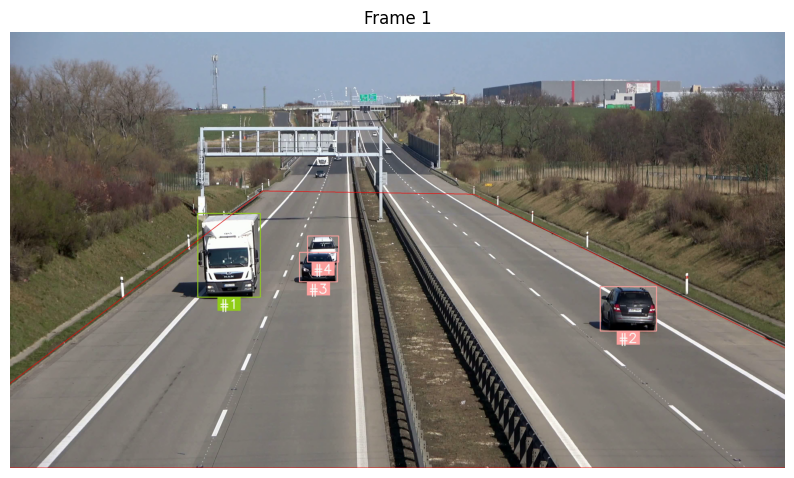

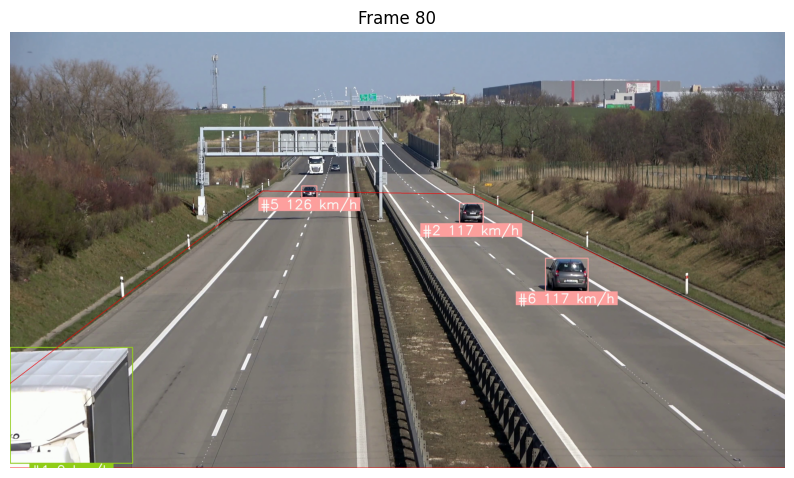

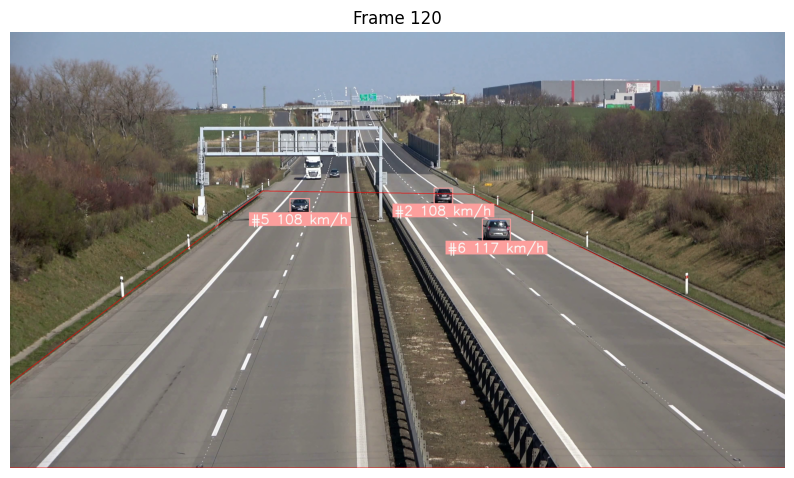

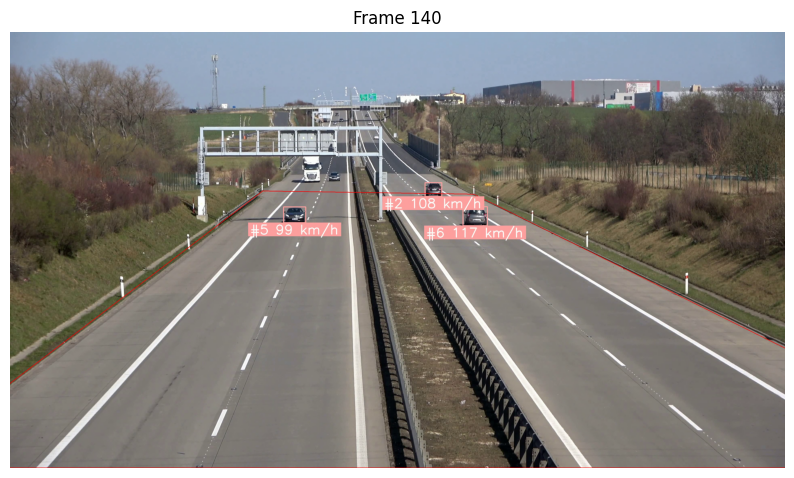

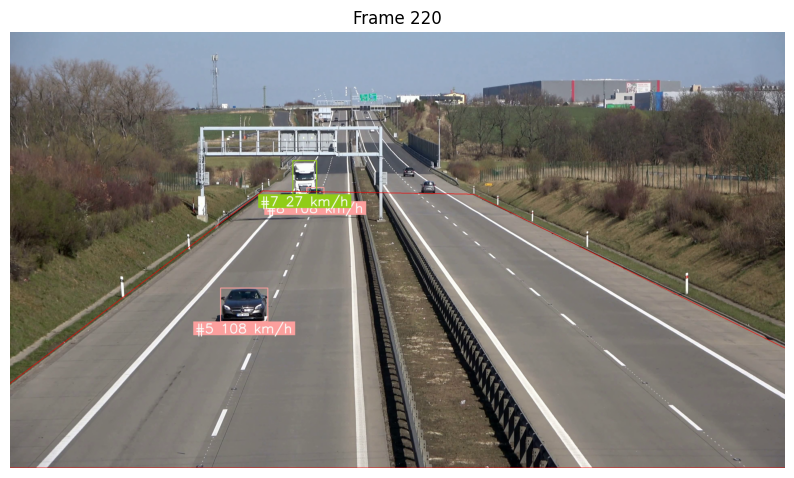

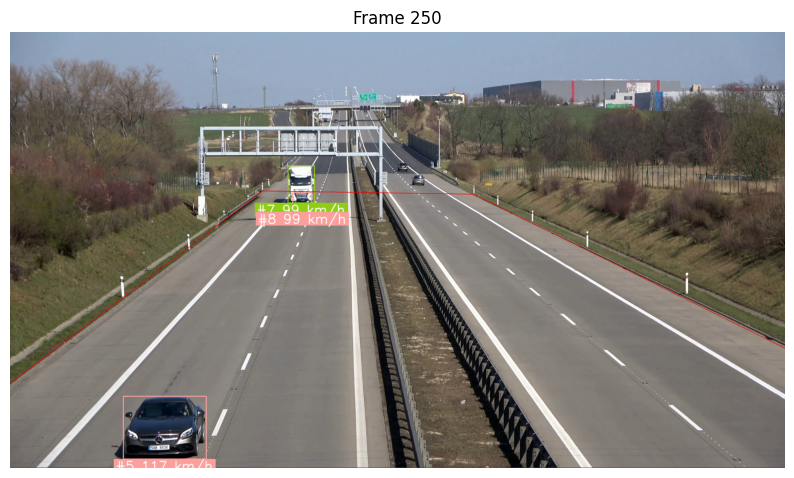

In [8]:
import matplotlib.pyplot as plt
# Function to display specific frames
def display_frames(video_path, frame_indices):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    for frame_index in frame_indices:
        # Set the video to the specified frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
        ret, frame = cap.read()
        if not ret:
            print(f"Error: Could not read frame {frame_index}.")
            continue

        # Convert the frame from BGR to RGB for display
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the frame using matplotlib
        plt.figure(figsize=(10, 6))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_index}")
        plt.axis("off")
        plt.show()

    # Release the video capture object
    cap.release()

# Specify the frames you want to display (e.g., frames 10, 50, 100)
frame_indices = [1, 80, 120,140, 220, 250]

# Display the specified frames
display_frames('/kaggle/working/result0.mp4', frame_indices)


## Stage 2&3: Improving Speed Detection Stability - Traffic Intensity Detection and Vehicle Counting


- #### Here, we need to calculate coordinates for upper and lower lines which will help us to count up and down vehicles. I suggest to do it automatically by polygonzone.roboflow site ([link](https://polygonzone.roboflow.com/)) , and copy the Coordinates.
  ![polygonzone.roboflow.upper_and lower_lines](https://i.ibb.co/Jw25FvHS/6.png)

In [9]:
# Define lower and upper lines in the source coordinate system
#lower_line_source = np.array([[SOURCE[0][0], SOURCE[0][1]], [SOURCE[1][0], SOURCE[1][1]]])*2  # Bottom edge of the polygon
#upper_line_source = np.array([[SOURCE[0][0], SOURCE[0][1]], [SOURCE[-1][0], SOURCE[1][1]]])*2  # Top edge of the polygon

lower_line_source = np.array([[1252, 787],[2298, 803],[-5039, 2159],[-550, 2159]])# Top edge of the polygon
upper_line_source = np.array([[-1252, 787],[2298, 803],[-5039, 2159],[-550, 2159]])*2   # Bottom edge of the polygon


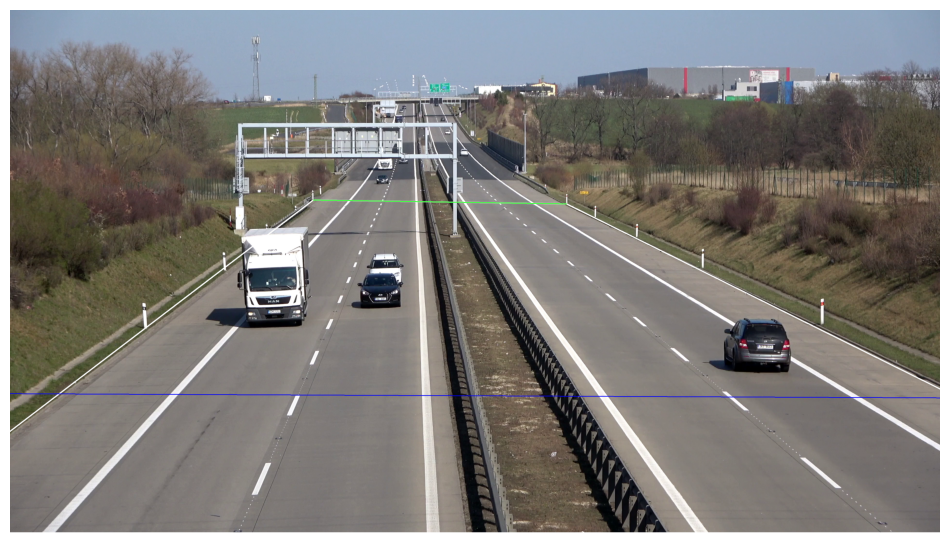

In [10]:
# Draw the lower line
annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(lower_line_source[0][0]), y=int(lower_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(lower_line_source[1][0]), y=int(lower_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 255, 0),  # Green color
    thickness=2
)

# Draw the upper line
annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(upper_line_source[0][0]), y=int(upper_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(upper_line_source[1][0]), y=int(upper_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 0, 255),  # Blue color
    thickness=2
)

# Display the annotated frame using sv.plot_image()
sv.plot_image(annotated_frame)

In [11]:
import numpy as np
from collections import deque, defaultdict
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from ultralytics import YOLO
import supervision as sv
import cv2

# Smoothing function using a moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

# Smoothing function using exponential smoothing
def exponential_smoothing(data, alpha):
    smoothed_data = [data[0]]
    for i in range(1, len(data)):
        smoothed_data.append(alpha * data[i] + (1 - alpha) * smoothed_data[i - 1])
    return smoothed_data

# Kalman Filter for speed estimation
class KalmanFilter:
    def __init__(self, process_variance, measurement_variance):
        self.process_variance = process_variance
        self.measurement_variance = measurement_variance
        self.estimated_value = 0
        self.estimation_error = 1

    def update(self, measurement):
        # Prediction
        self.estimation_error += self.process_variance

        # Update
        kalman_gain = self.estimation_error / (self.estimation_error + self.measurement_variance)
        self.estimated_value += kalman_gain * (measurement - self.estimated_value)
        self.estimation_error *= (1 - kalman_gain)

        return self.estimated_value

# Initialize YOLO model
model = YOLO("yolo11x.pt")

# Video information and frame generator
SOURCE_VIDEO_PATH = "/kaggle/working/vehicles.mp4"
TARGET_VIDEO_PATH = "result1.mp4"
video_info = sv.VideoInfo.from_video_path(video_path=SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(source_path=SOURCE_VIDEO_PATH)

# ByteTrack tracker initialization
CONFIDENCE_THRESHOLD = 0.4
byte_track = sv.ByteTrack(frame_rate=video_info.fps, track_activation_threshold=CONFIDENCE_THRESHOLD)

# Annotators configuration
thickness = sv.calculate_optimal_line_thickness(resolution_wh=video_info.resolution_wh)
text_scale = sv.calculate_optimal_text_scale(resolution_wh=video_info.resolution_wh)
bounding_box_annotator = sv.BoxAnnotator(thickness=thickness, color_lookup=sv.ColorLookup.TRACK)
label_annotator = sv.LabelAnnotator(text_scale=text_scale, text_thickness=thickness, text_position=sv.Position.BOTTOM_CENTER, color_lookup=sv.ColorLookup.TRACK)
trace_annotator = sv.TraceAnnotator(thickness=thickness, trace_length=video_info.fps, position=sv.Position.BOTTOM_CENTER, color_lookup=sv.ColorLookup.TRACK)

# Polygon zone for detection filtering
polygon_zone = sv.PolygonZone(polygon=SOURCE)
view_transformer = ViewTransformer(source=SOURCE, target=TARGET)

# Transform the lines to the target coordinate system
lower_line_target = view_transformer.transform_points(lower_line_source)
upper_line_target = view_transformer.transform_points(upper_line_source)

# Extract the Y-coordinates of the transformed lines
lower_line_y = lower_line_target[0][1]  # Y-coordinate of the lower line
upper_line_y = upper_line_target[0][1]  # Y-coordinate of the upper line

# Dictionary to store coordinates for each tracked vehicle
coordinates = defaultdict(lambda: deque(maxlen=video_info.fps * 2))  # Larger window for smoothing

# Dictionary to store Kalman filters for each tracker_id
kalman_filters = {}

# Define counting variables
up_count = 0
down_count = 0

# Define traffic level thresholds
TRAFFIC_THRESHOLDS = {"Low": 5, "Moderate": 15}  # Vehicles per minute

def classify_traffic(count):
    if count <= TRAFFIC_THRESHOLDS["Low"]:
        return "Low", (0, 255, 0)  # Green
    elif count <= TRAFFIC_THRESHOLDS["Moderate"]:
        return "Moderate", (0, 255, 255)  # Yellow
    else:
        return "Heavy", (0, 0, 255)  # Red

# Callback function for processing each frame
# Update the counting logic in the callback function
def callback(frame: np.ndarray, index: int) -> np.ndarray:
    global up_count, down_count

    # Perform object detection using YOLO
    result = model(frame, imgsz=1280, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(result)

    # Filter detections by confidence and class
    detections = detections[detections.confidence > CONFIDENCE_THRESHOLD]
    detections = detections[detections.class_id != 0]

    # Filter detections outside the polygon zone
    detections = detections[polygon_zone.trigger(detections)]

    # Apply non-max suppression to refine detections
    detections = detections.with_nms(0.5)

    # Update detections with ByteTrack tracker
    detections = byte_track.update_with_detections(detections=detections)

    # Get bottom center coordinates of detections
    points = detections.get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)

    # Transform points to the target ROI
    points = view_transformer.transform_points(points=points).astype(int)

  
    # Store coordinates for each tracked vehicle
    for tracker_id, [_, y] in zip(detections.tracker_id, points):
        if tracker_id not in coordinates:
            coordinates[tracker_id] = deque(maxlen=video_info.fps * 2)  # Larger window for smoothing

        prev_y = coordinates[tracker_id][-1] if coordinates[tracker_id] else None
        coordinates[tracker_id].append(y)

        if prev_y is not None:
            # Moving up (crossing the lower line)
            if prev_y > lower_line_y >= y:
                up_count += 1
            # Moving down (crossing the upper line)
            elif prev_y < upper_line_y <= y:
                down_count += 1

    
    # Determine traffic level
    total_count = up_count + down_count
    
    # Count the number of vehicles in the current frame
    current_vehicle_count = len(detections)

    # Determine traffic level based on the current vehicle count
    traffic_level, color = classify_traffic(current_vehicle_count)

    # Overlay vehicle count & traffic level with better visualization
    overlay = frame.copy()
    cv2.rectangle(overlay, (30, 20), (520, 180), (50, 50, 50), -1)
    alpha = 0.6
    frame = cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0)

    # Adding a border around the text area for enhanced clarity
    cv2.rectangle(frame, (30, 20), (520, 180), (255, 255, 255), 2)

    # Display Up&Down vehicle counts and traffic level
    cv2.putText(frame, f"Up: {up_count}", (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(frame, f"Down: {down_count}", (50, 90), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    
    # Display Vehicle counts and traffic level
    cv2.putText(frame, f"Vehicles: {current_vehicle_count}", (50, 130), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(frame, f"Traffic Intensity: {traffic_level}", (50, 170), cv2.FONT_HERSHEY_DUPLEX, 1, color, 3, cv2.LINE_AA)

    # Format labels for detections
    labels = []
    for tracker_id in detections.tracker_id:
        if len(coordinates[tracker_id]) < video_info.fps / 2:
            labels.append(f"#{tracker_id}")
        else:
            # Calculate speed using multiple points
            y_coords = list(coordinates[tracker_id])
            distances = np.abs(np.diff(y_coords))
            times = np.arange(len(y_coords)) / video_info.fps
            speeds = distances / np.diff(times) * 3.6  # Convert to km/h

            # Apply smoothing (e.g., moving average)
            smoothed_speeds = moving_average(speeds, window_size=5)

            # Initialize Kalman filter for new tracker_id
            if tracker_id not in kalman_filters:
                kalman_filters[tracker_id] = KalmanFilter(process_variance=1e-5, measurement_variance=0.1)

            # Apply Kalman filter to smooth the speed
            filtered_speed = kalman_filters[tracker_id].update(np.mean(smoothed_speeds))

            # Append the filtered speed to the labels
            labels.append(f"#{tracker_id} {int(filtered_speed)} km/h")

    # Annotate the frame with bounding boxes, traces, and labels
    annotated_frame = bounding_box_annotator.annotate(frame.copy(), detections=detections)
    annotated_frame = trace_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = label_annotator.annotate(annotated_frame, detections=detections, labels=labels)
    
# Draw the lower line
    annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(lower_line_source[0][0]), y=int(lower_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(lower_line_source[1][0]), y=int(lower_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 255, 0),  # Green color
    thickness=2
)

# Draw the upper line
    annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(upper_line_source[0][0]), y=int(upper_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(upper_line_source[1][0]), y=int(upper_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 0, 255),  # Blue color
    thickness=2
)
    return annotated_frame

# Process the video
sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback)

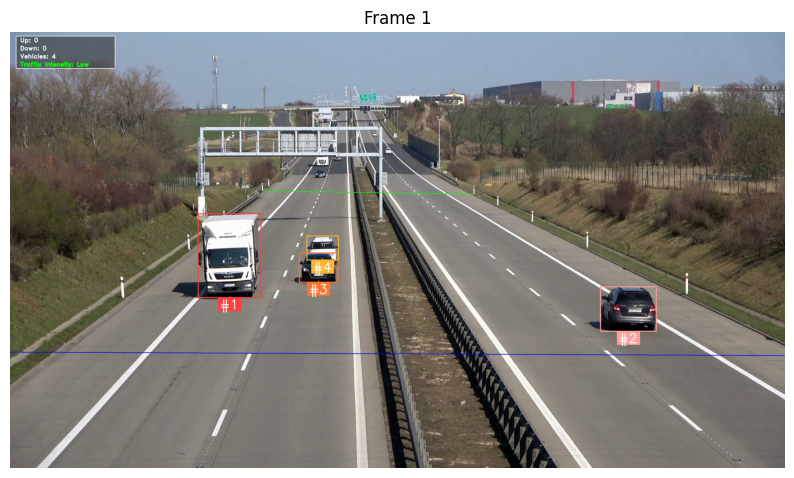

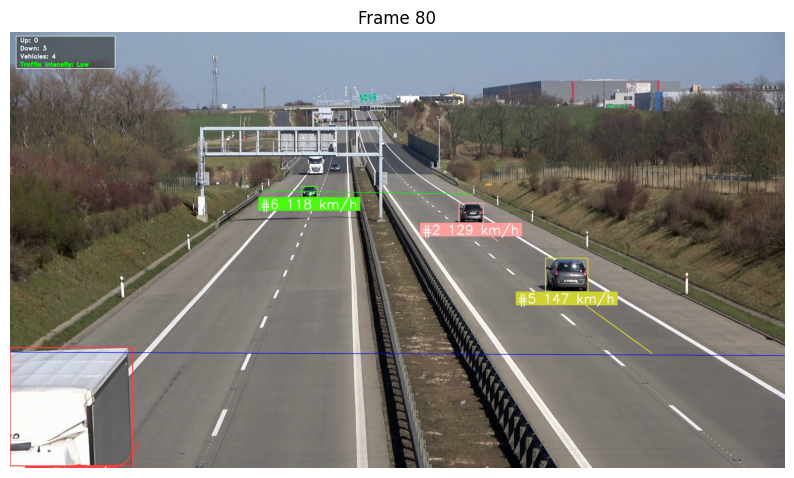

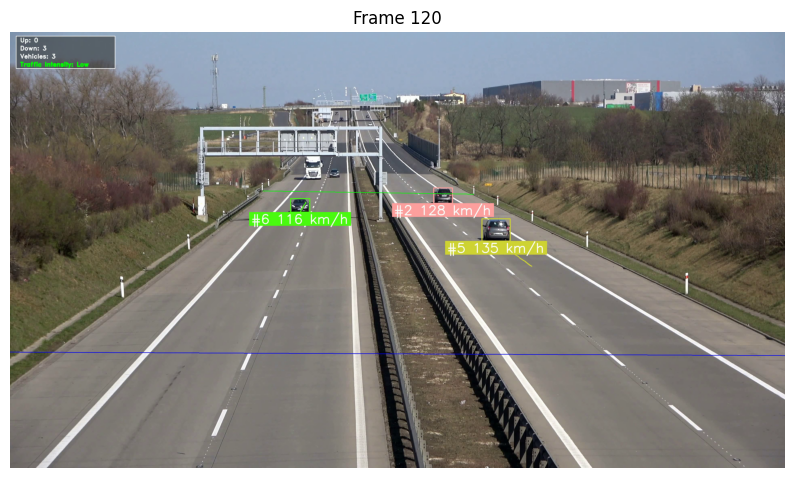

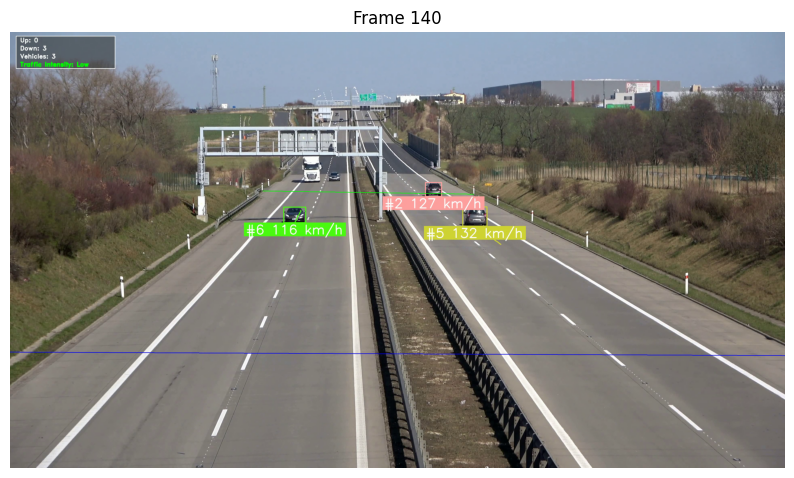

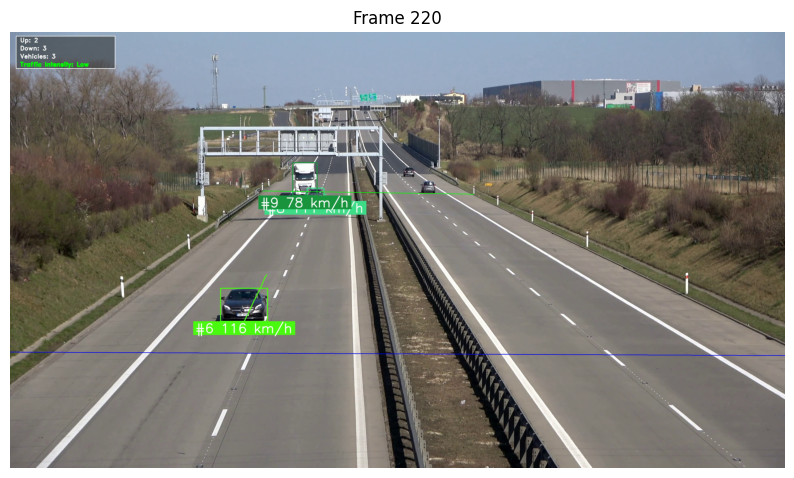

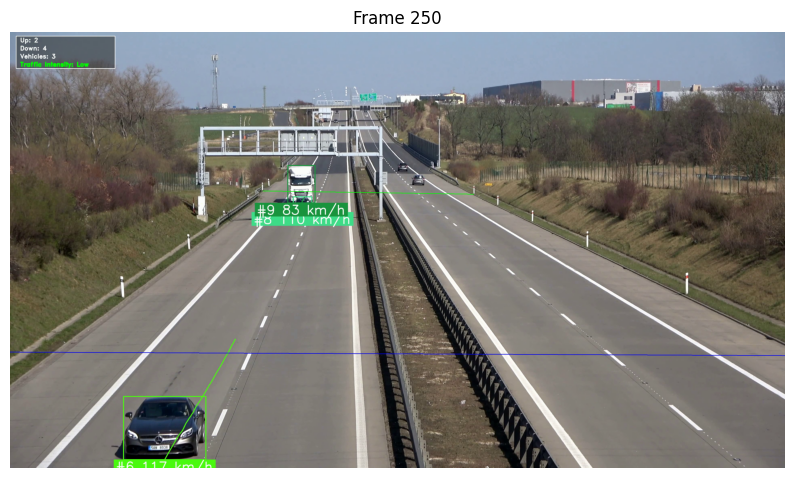

In [12]:
import matplotlib.pyplot as plt
# Function to display specific frames
def display_frames(video_path, frame_indices):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    for frame_index in frame_indices:
        # Set the video to the specified frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
        ret, frame = cap.read()
        if not ret:
            print(f"Error: Could not read frame {frame_index}.")
            continue

        # Convert the frame from BGR to RGB for display
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the frame using matplotlib
        plt.figure(figsize=(10, 6))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_index}")
        plt.axis("off")
        plt.show()

    # Release the video capture object
    cap.release()

# Specify the frames you want to display (e.g., frames 10, 50, 100)
frame_indices = [1, 80, 120,140, 220, 250]

# Display the specified frames
display_frames('/kaggle/working/result1.mp4', frame_indices)


### For Another video

In [13]:
SOURCE = np.array([
   [655, 293], [1185, 299], [2919, 1079], [-1700, 1079]
])

TARGET_WIDTH = 25
TARGET_HEIGHT = 250

TARGET = np.array([
    [0, 0],
    [TARGET_WIDTH - 1, 0],
    [TARGET_WIDTH - 1, TARGET_HEIGHT - 1],
    [0, TARGET_HEIGHT - 1],
])

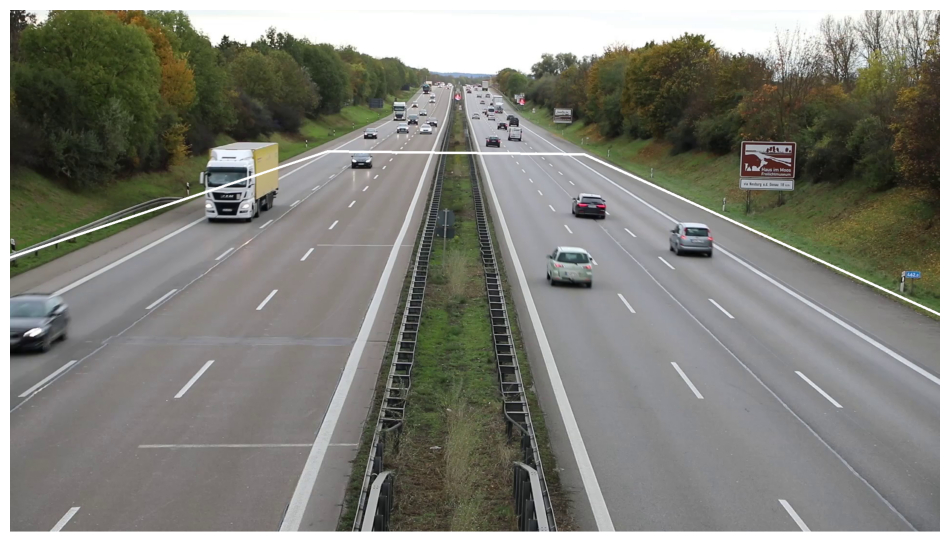

In [14]:
# Video information and frame generator
SOURCE_VIDEO_PATH = "/kaggle/input/free-vehicle/56310-479197605.mp4"
TARGET_VIDEO_PATH = "result2.mp4"
video_info = sv.VideoInfo.from_video_path(video_path=SOURCE_VIDEO_PATH)
### Display polygon zone
frame_generator = sv.get_video_frames_generator(source_path=SOURCE_VIDEO_PATH)
frame_iterator = iter(frame_generator)
frame = next(frame_iterator)
annotated_frame = frame.copy()

# Draw the polygon
annotated_frame = sv.draw_polygon(
    scene=annotated_frame, 
    polygon=SOURCE, 
    color=sv.Color(255, 255, 255),  # White color
    thickness=4
)
# Display the annotated frame using sv.plot_image()
sv.plot_image(annotated_frame)

In [15]:
# Define lower and upper lines in the source coordinate system
#lower_line_source = np.array([[SOURCE[0][0], SOURCE[0][1]], [SOURCE[1][0], SOURCE[1][1]]])*2  # Bottom edge of the polygon
#upper_line_source = np.array([[SOURCE[0][0], SOURCE[0][1]], [SOURCE[-1][0], SOURCE[1][1]]])*2  # Top edge of the polygon

lower_line_source = np.array([[655, 293],[1185, 299],[2919, 1079],[1700, 1079]]) # Bottom edge of the polygon
upper_line_source = np.array([[1727, 557],[65, 537],[65, 797],[65, 537]])   # Bottom edge of the polygon


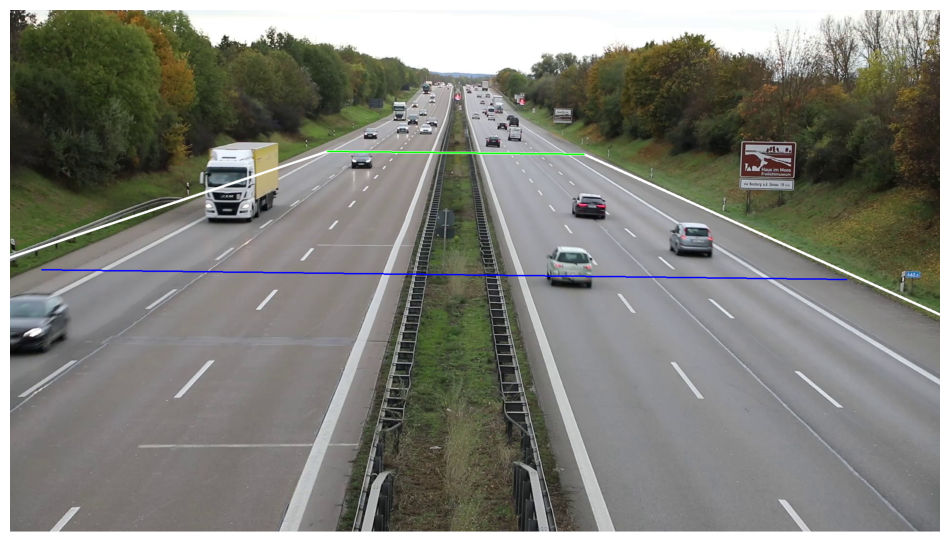

In [16]:
# Draw the lower line
annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(lower_line_source[0][0]), y=int(lower_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(lower_line_source[1][0]), y=int(lower_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 255, 0),  # Green color
    thickness=2
)

# Draw the upper line
annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(upper_line_source[0][0]), y=int(upper_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(upper_line_source[1][0]), y=int(upper_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 0, 255),  # Blue color
    thickness=2
)

# Display the annotated frame using sv.plot_image()
sv.plot_image(annotated_frame)

In [17]:
class ViewTransformer:

    def __init__(self, source: np.ndarray, target: np.ndarray) -> None:
        source = source.astype(np.float32)
        target = target.astype(np.float32)
        self.m = cv2.getPerspectiveTransform(source, target)

    def transform_points(self, points: np.ndarray) -> np.ndarray:
        if points.size == 0:
            return points

        reshaped_points = points.reshape(-1, 1, 2).astype(np.float32)
        transformed_points = cv2.perspectiveTransform(reshaped_points, self.m)
        return transformed_points.reshape(-1, 2)


In [18]:
import numpy as np
from collections import deque, defaultdict
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from ultralytics import YOLO
import supervision as sv
import cv2

# Smoothing function using a moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

# Smoothing function using exponential smoothing
def exponential_smoothing(data, alpha):
    smoothed_data = [data[0]]
    for i in range(1, len(data)):
        smoothed_data.append(alpha * data[i] + (1 - alpha) * smoothed_data[i - 1])
    return smoothed_data

# Kalman Filter for speed estimation
class KalmanFilter:
    def __init__(self, process_variance, measurement_variance):
        self.process_variance = process_variance
        self.measurement_variance = measurement_variance
        self.estimated_value = 0
        self.estimation_error = 1

    def update(self, measurement):
        # Prediction
        self.estimation_error += self.process_variance

        # Update
        kalman_gain = self.estimation_error / (self.estimation_error + self.measurement_variance)
        self.estimated_value += kalman_gain * (measurement - self.estimated_value)
        self.estimation_error *= (1 - kalman_gain)

        return self.estimated_value

# Initialize YOLO model
model = YOLO("yolo11x.pt")

# Video information and frame generator
SOURCE_VIDEO_PATH = "/kaggle/input/free-vehicle/56310-479197605.mp4"
TARGET_VIDEO_PATH = "result2.mp4"
video_info = sv.VideoInfo.from_video_path(video_path=SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(source_path=SOURCE_VIDEO_PATH)

# ByteTrack tracker initialization
CONFIDENCE_THRESHOLD = 0.4
byte_track = sv.ByteTrack(frame_rate=video_info.fps, track_activation_threshold=CONFIDENCE_THRESHOLD)

# Annotators configuration
thickness = sv.calculate_optimal_line_thickness(resolution_wh=video_info.resolution_wh)
text_scale = sv.calculate_optimal_text_scale(resolution_wh=video_info.resolution_wh) *0.6
bounding_box_annotator = sv.BoxAnnotator(thickness=thickness, color_lookup=sv.ColorLookup.TRACK)
label_annotator = sv.LabelAnnotator(text_scale=text_scale, text_thickness=thickness, text_position=sv.Position.BOTTOM_CENTER, color_lookup=sv.ColorLookup.TRACK)
trace_annotator = sv.TraceAnnotator(thickness=thickness, trace_length=video_info.fps, position=sv.Position.BOTTOM_CENTER, color_lookup=sv.ColorLookup.TRACK)

# Polygon zone for detection filtering
polygon_zone = sv.PolygonZone(polygon=SOURCE)
view_transformer = ViewTransformer(source=SOURCE, target=TARGET)

# Transform the lines to the target coordinate system
lower_line_target = view_transformer.transform_points(lower_line_source)
upper_line_target = view_transformer.transform_points(upper_line_source)

# Extract the Y-coordinates of the transformed lines
lower_line_y = lower_line_target[0][1]  # Y-coordinate of the lower line
upper_line_y = upper_line_target[0][1]  # Y-coordinate of the upper line

# Dictionary to store coordinates for each tracked vehicle
coordinates = defaultdict(lambda: deque(maxlen=video_info.fps * 2))  # Larger window for smoothing

# Dictionary to store Kalman filters for each tracker_id
kalman_filters = {}

# Define counting variables
up_count = 0
down_count = 0

# Define traffic level thresholds
TRAFFIC_THRESHOLDS = {"Low": 5, "Moderate": 15}  # Vehicles per minute

def classify_traffic(count):
    if count <= TRAFFIC_THRESHOLDS["Low"]:
        return "Low", (0, 255, 0)  # Green
    elif count <= TRAFFIC_THRESHOLDS["Moderate"]:
        return "Moderate", (0, 255, 255)  # Yellow
    else:
        return "Heavy", (0, 0, 255)  # Red

# Callback function for processing each frame
# Update the counting logic in the callback function
def callback(frame: np.ndarray, index: int) -> np.ndarray:
    global up_count, down_count

    # Perform object detection using YOLO
    result = model(frame, imgsz=1280, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(result)

    # Filter detections by confidence and class
    detections = detections[detections.confidence > CONFIDENCE_THRESHOLD]
    detections = detections[detections.class_id != 0]

    # Filter detections outside the polygon zone
    detections = detections[polygon_zone.trigger(detections)]

    # Apply non-max suppression to refine detections
    detections = detections.with_nms(0.5)

    # Update detections with ByteTrack tracker
    detections = byte_track.update_with_detections(detections=detections)

    # Get bottom center coordinates of detections
    points = detections.get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)

    # Transform points to the target ROI
    points = view_transformer.transform_points(points=points).astype(int)

  
    # Store coordinates for each tracked vehicle
    for tracker_id, [_, y] in zip(detections.tracker_id, points):
        if tracker_id not in coordinates:
            coordinates[tracker_id] = deque(maxlen=video_info.fps * 2)  # Larger window for smoothing

        prev_y = coordinates[tracker_id][-1] if coordinates[tracker_id] else None
        coordinates[tracker_id].append(y)

        if prev_y is not None:
            # Moving up (crossing the lower line)
            if prev_y > lower_line_y >= y:
                up_count += 1
            # Moving down (crossing the upper line)
            elif prev_y < upper_line_y <= y:
                down_count += 1

    
    # Determine traffic level
    total_count = up_count + down_count
    
    # Count the number of vehicles in the current frame
    current_vehicle_count = len(detections)

    # Determine traffic level based on the current vehicle count
    traffic_level, color = classify_traffic(current_vehicle_count)

    # Overlay vehicle count & traffic level with better visualization
    overlay = frame.copy()
    cv2.rectangle(overlay, (30, 20), (520, 180), (50, 50, 50), -1)
    alpha = 0.6
    frame = cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0)

    # Adding a border around the text area for enhanced clarity
    cv2.rectangle(frame, (30, 20), (520, 180), (255, 255, 255), 2)

    # Display Up&Down vehicle counts and traffic level
    cv2.putText(frame, f"Up: {up_count}", (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(frame, f"Down: {down_count}", (50, 90), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    
    # Display Vehicle counts and traffic level
    cv2.putText(frame, f"Vehicles: {current_vehicle_count}", (50, 130), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(frame, f"Traffic Intensity: {traffic_level}", (50, 170), cv2.FONT_HERSHEY_DUPLEX, 1, color, 3, cv2.LINE_AA)

    # Format labels for detections
    labels = []
    for tracker_id in detections.tracker_id:
        if len(coordinates[tracker_id]) < video_info.fps / 2:
            labels.append(f"#{tracker_id}")
        else:
            # Calculate speed using multiple points
            y_coords = list(coordinates[tracker_id])
            distances = np.abs(np.diff(y_coords))
            times = np.arange(len(y_coords)) / video_info.fps
            speeds = distances / np.diff(times) * 3.6  # Convert to km/h

            # Apply smoothing (e.g., moving average)
            smoothed_speeds = moving_average(speeds, window_size=5)

            # Initialize Kalman filter for new tracker_id
            if tracker_id not in kalman_filters:
                kalman_filters[tracker_id] = KalmanFilter(process_variance=1e-5, measurement_variance=0.1)

            # Apply Kalman filter to smooth the speed
            filtered_speed = kalman_filters[tracker_id].update(np.mean(smoothed_speeds))

            # Append the filtered speed to the labels
            labels.append(f"#{tracker_id} {int(filtered_speed)} km/h")

    # Annotate the frame with bounding boxes, traces, and labels
    annotated_frame = bounding_box_annotator.annotate(frame.copy(), detections=detections)
    annotated_frame = trace_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = label_annotator.annotate(annotated_frame, detections=detections, labels=labels)

# Draw the lower line
    annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(lower_line_source[0][0]), y=int(lower_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(lower_line_source[1][0]), y=int(lower_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 255, 0),  # Green color
    thickness=2
)

# Draw the upper line
    annotated_frame = sv.draw_line(
    scene=annotated_frame, 
    start=sv.Point(x=int(upper_line_source[0][0]), y=int(upper_line_source[0][1])),  # Start point of the line
    end=sv.Point(x=int(upper_line_source[1][0]), y=int(upper_line_source[1][1])),    # End point of the line
    color=sv.Color(0, 0, 255),  # Blue color
    thickness=2
)
    return annotated_frame

# Process the video
sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback)

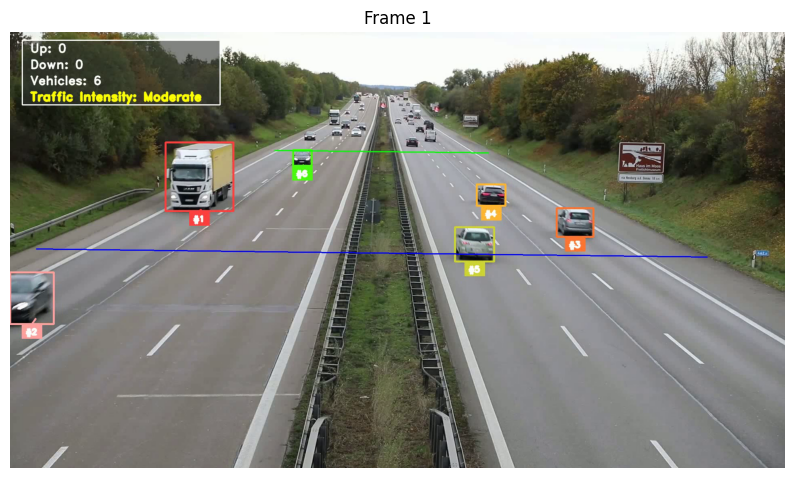

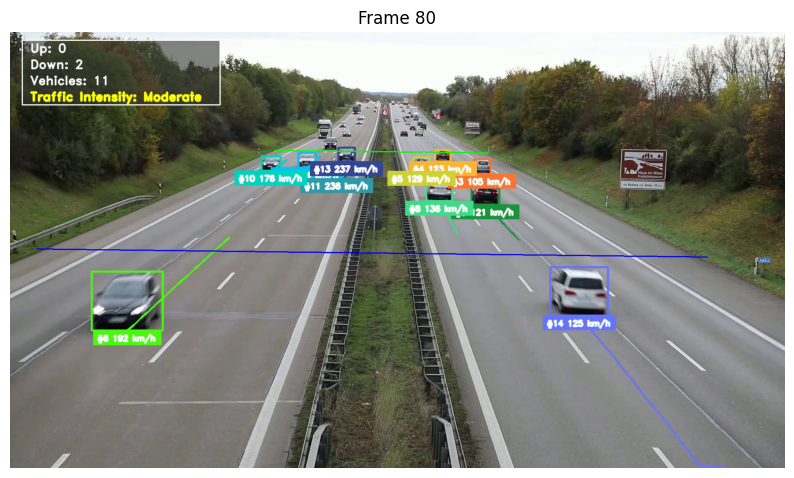

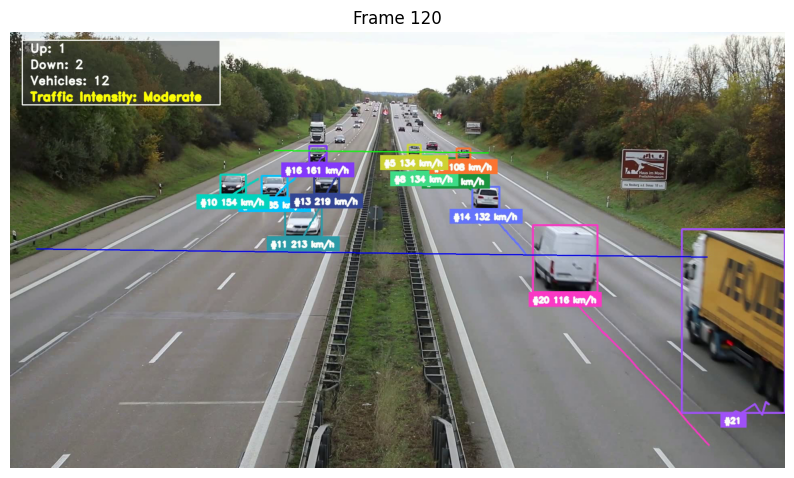

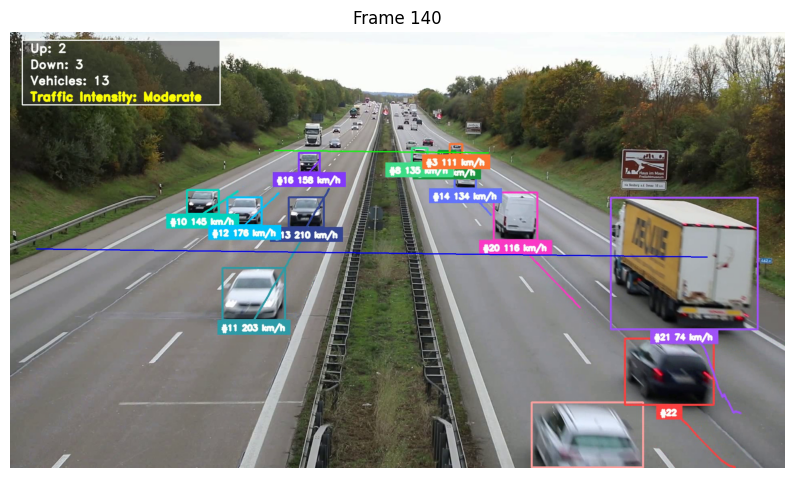

In [19]:
import matplotlib.pyplot as plt
# Function to display specific frames
def display_frames(video_path, frame_indices):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    for frame_index in frame_indices:
        # Set the video to the specified frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
        ret, frame = cap.read()
        if not ret:
            print(f"Error: Could not read frame {frame_index}.")
            continue

        # Convert the frame from BGR to RGB for display
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the frame using matplotlib
        plt.figure(figsize=(10, 6))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_index}")
        plt.axis("off")
        plt.show()

    # Release the video capture object
    cap.release()

# Specify the frames you want to display (e.g., frames 10, 50, 100)
frame_indices = [1, 80, 120,140]

# Display the specified frames
display_frames('/kaggle/working/result2.mp4', frame_indices)
